In [2]:
import numpy as np
import numpy.matlib
from matplotlib import pyplot as plt
import math
import time
from keras.datasets import mnist

### Flatten the image (1D array), array of pixels of each image as a feature 

In [3]:
(Xtr, Ltr), (X_test, L_test) = mnist.load_data()
sample_size = 100

Xtr = Xtr[:sample_size]
Ltr = Ltr[:sample_size]

X_test = X_test[:sample_size]
L_test = L_test[:sample_size]


Xtr_flatten = Xtr.reshape(Xtr.shape[0], -1) /255
X_test_flatten = X_test.reshape(X_test.shape[0], -1) /255

print(Xtr.shape)
print(X_test.shape)

(100, 28, 28)
(100, 28, 28)


In [4]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [5]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [6]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [7]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [8]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [9]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training with",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
    
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;

    if showMode >= 1:
        print("\nSOM features AFTER training",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
            ax[k,l].set_xticks([])   
    return som
    

In [2]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        # 0: input_data.iloc[:, [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].values
        0: input_data[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].to_numpy()
    }

    return input_database, labels, classes

In [11]:
input_filename = 'data/zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename, None)


In [12]:
# som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


In [13]:
# number_of_dimensions = [20,40,80]

# for ndim in number_of_dimensions:
#     som_trained_20x20=SOM ([28,28],Xtr, ndim, showMode=1)

# plt.show()


In [14]:
#verification of correctness on the training set:



def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    



Training Set


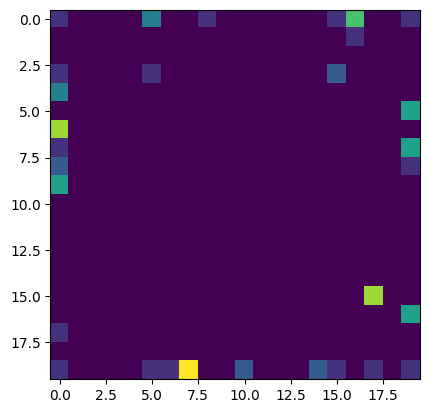

[[41.  0.  0.  0.  0.  0.  0.]
 [13.  6.  0.  0.  0.  0.  0.]
 [ 2.  1.  2.  0.  0.  0.  0.]
 [ 9.  0.  0.  4.  0.  0.  0.]
 [ 2.  0.  0.  1.  1.  0.  0.]
 [ 6.  0.  0.  0.  0.  2.  0.]
 [ 8.  0.  0.  1.  0.  0.  1.]]


In [15]:
def getConfusionMatrix(train_data, SOM, ndim):
    nrows=ndim
    ncols=ndim
    grid_color=np.zeros((nrows,ncols))
    nclasses=np.max(classes)

    confusion_matrix=np.zeros((nclasses,nclasses))
    grid_color,confusion_matrix=SOM_Test (train_data, SOM, classes, grid_color, confusion_matrix, ndim)

    plt.close()
    plt.imshow(grid_color)
    plt.show()

    return confusion_matrix, Xtr_flatten.shape, np.sum(confusion_matrix)

print("Training Set")
som_20x20 = SOM([28,28], Xtr_flatten, ndim=20)
confusion_matrix, shape, sum_matrix = getConfusionMatrix(Xtr_flatten, som_20x20, ndim=20)
print(confusion_matrix)




SOM features before training with 20  dim: 


SOM features AFTER training 20  dim: 

20x20 Training Accuracy: 0.62
20x20 Test Accuracy: 0.7

SOM features before training with 40  dim: 


SOM features AFTER training 40  dim: 

40x40 Training Accuracy: 0.7
40x40 Test Accuracy: 0.75

SOM features before training with 80  dim: 


SOM features AFTER training 80  dim: 

80x80 Training Accuracy: 0.91
80x80 Test Accuracy: 0.95


C:\Users\Ellio\AppData\Local\Temp\ipykernel_10672\2236297418.py:50: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


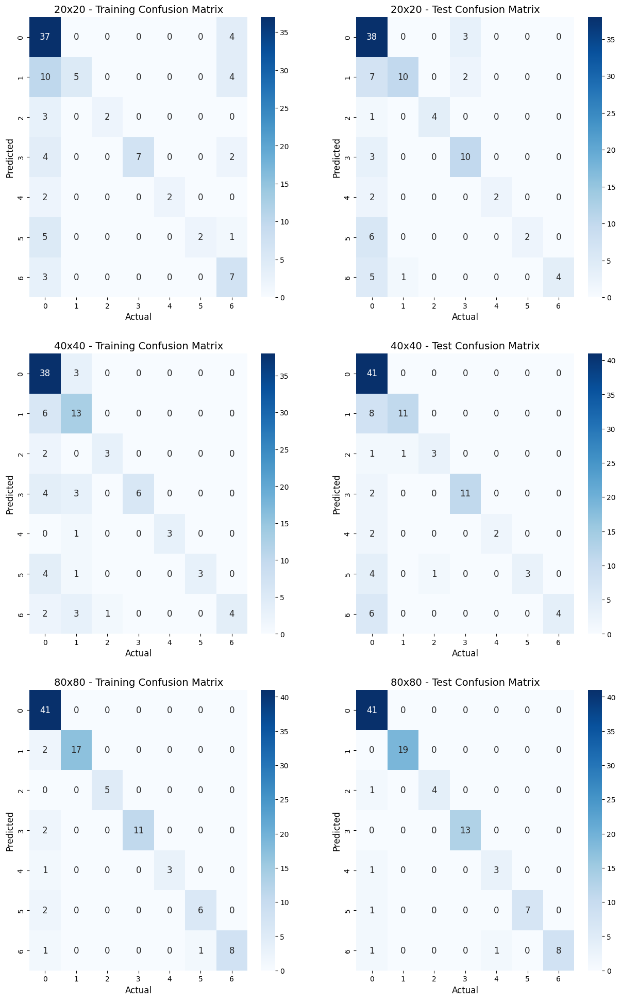

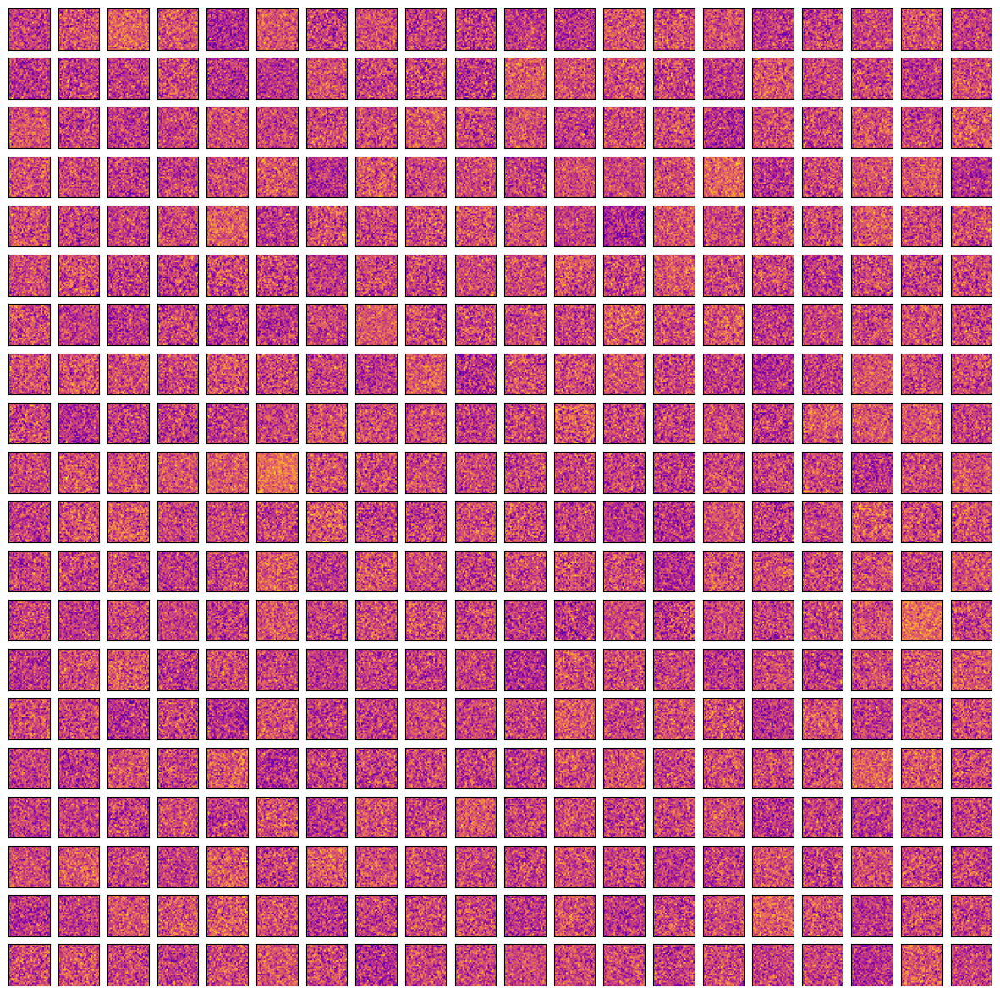

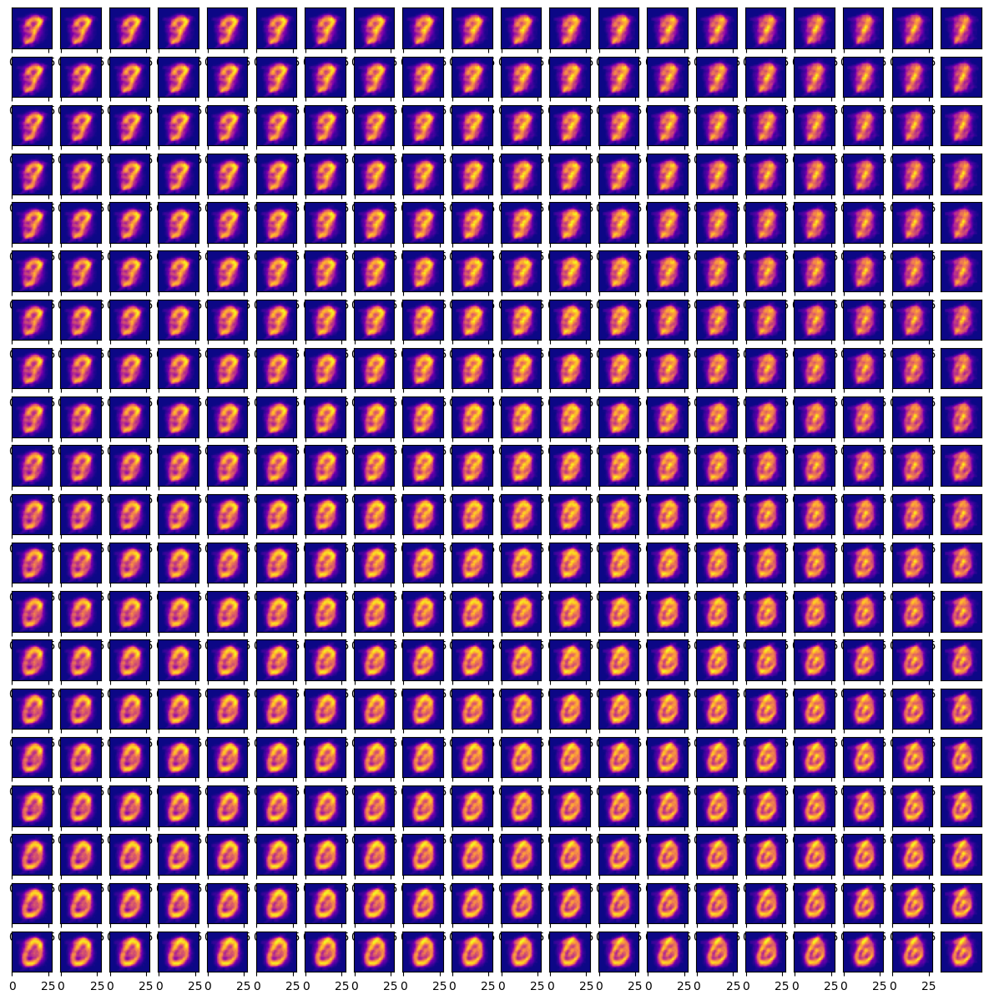

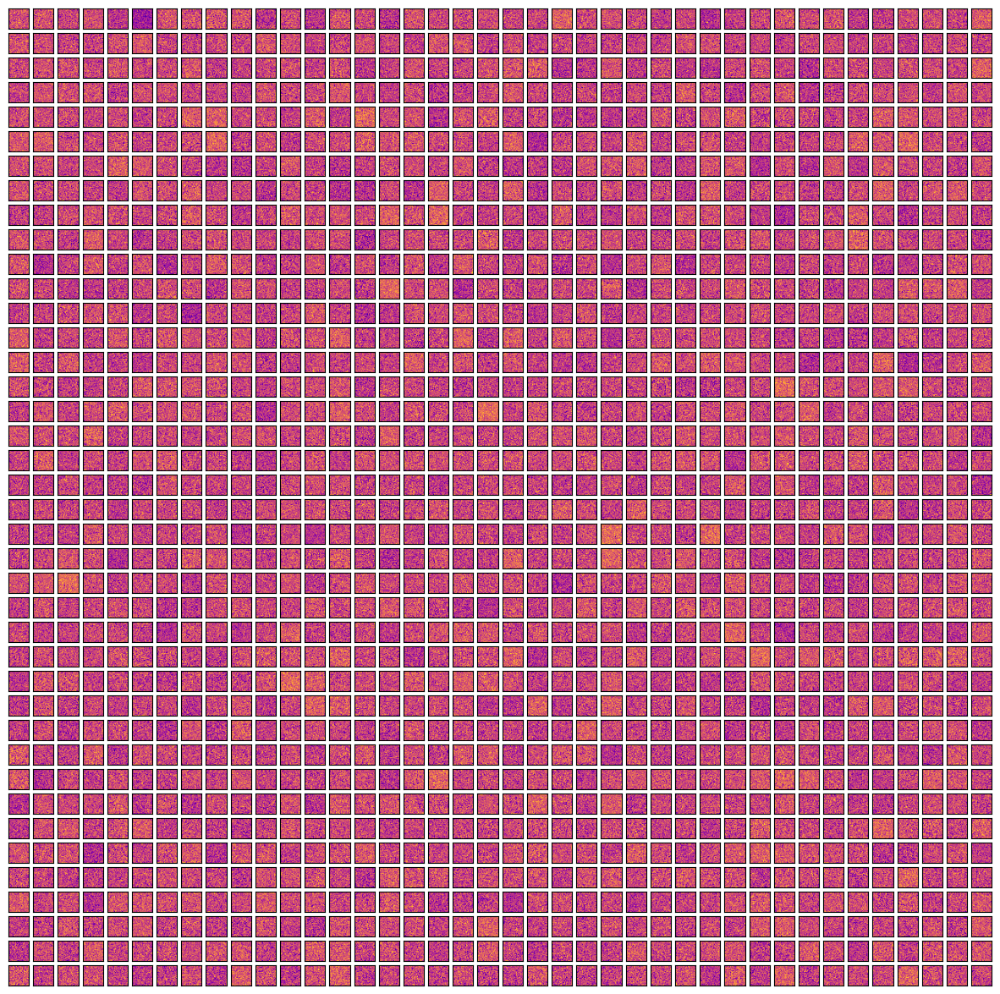

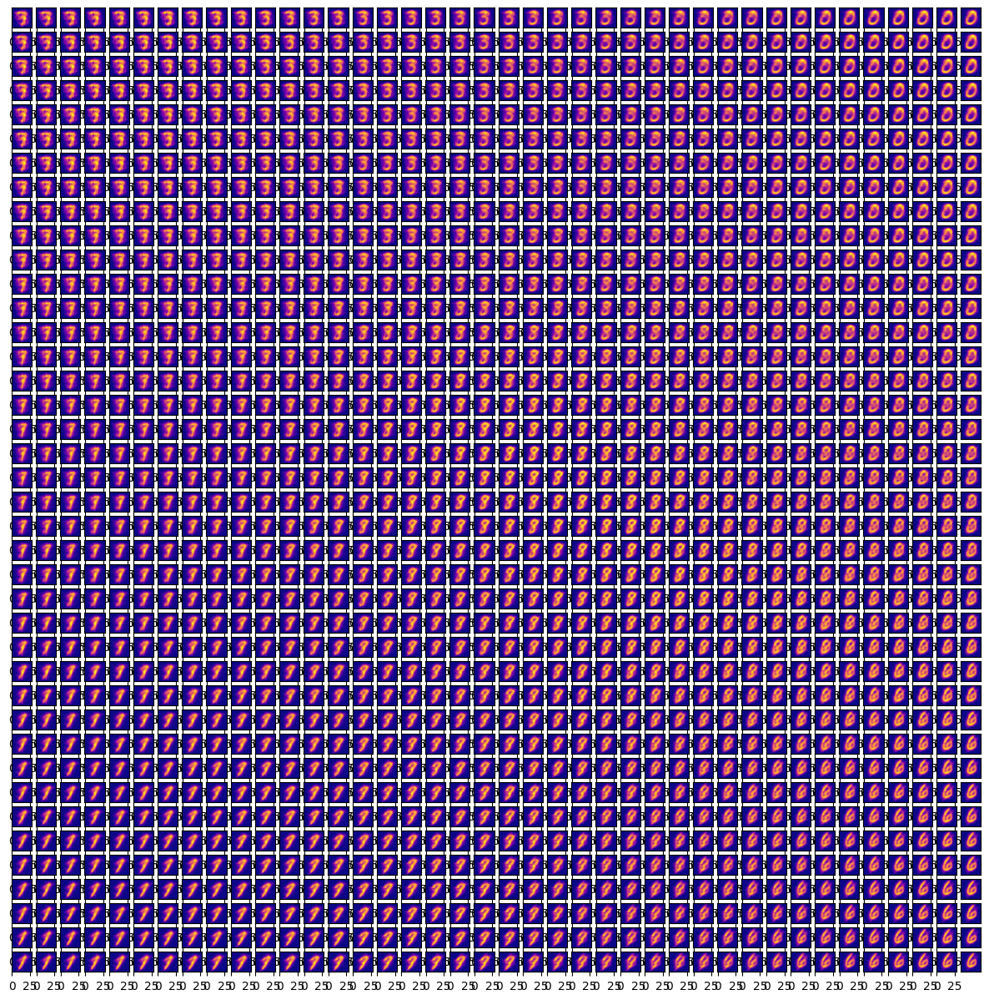

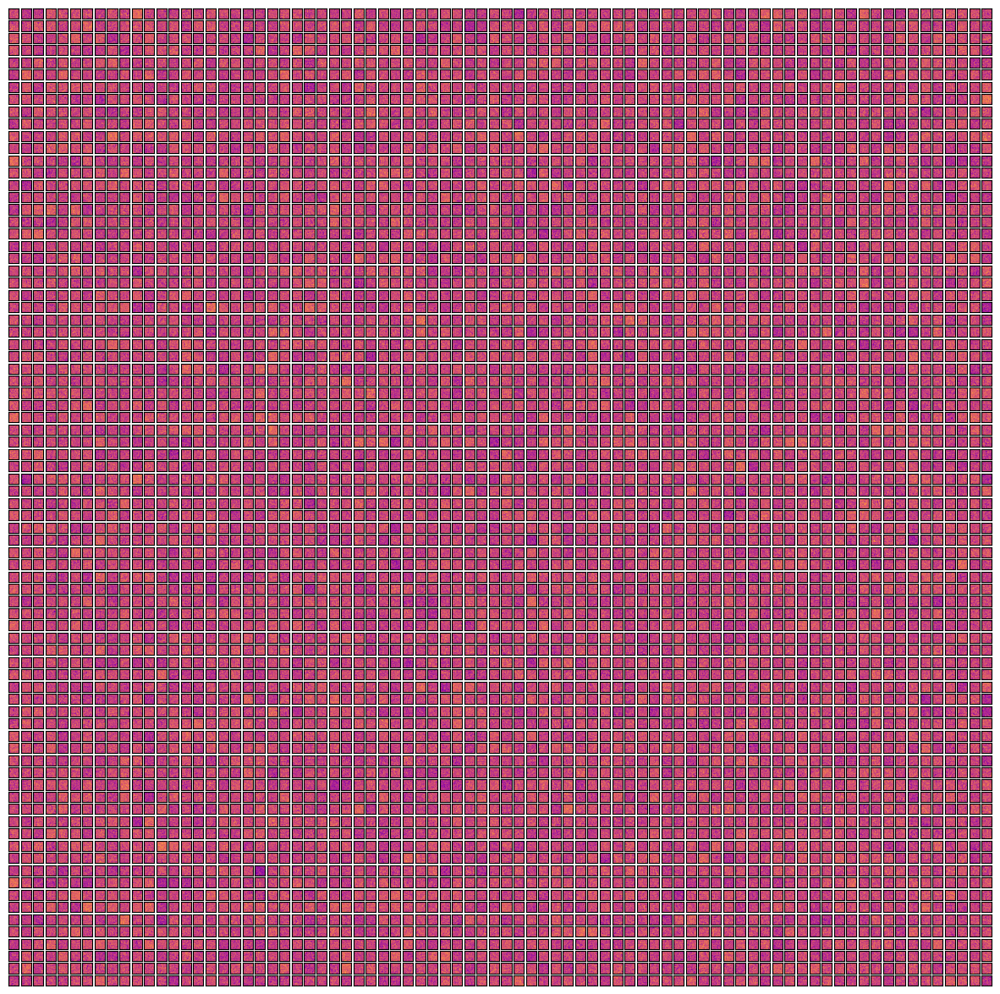

In [ ]:
import seaborn as sns

(Xtr, Ltr), (X_test, L_test) = mnist.load_data()
sample_size = 100

Xtr = Xtr[:sample_size]
Ltr = Ltr[:sample_size]
X_test = X_test[:sample_size]
L_test = L_test[:sample_size]

# Flatten and normalize
Xtr_flatten = Xtr.reshape(Xtr.shape[0], -1) / 255.0
X_test_flatten = X_test.reshape(X_test.shape[0], -1) / 255.0


# Plot confusion matrices for 20x20, 40x40, 80x80 SOM grids
number_of_dimensions = [20, 40, 80]
fig, axes = plt.subplots(len(number_of_dimensions), 2, figsize=(15, len(number_of_dimensions) * 8))

for i, ndim in enumerate(number_of_dimensions):
    # Train SOM
    som_trained = SOM([28, 28], Xtr_flatten, showMode=1, ndim=ndim)

    # Initialize confusion matrices
    nrows=ndim
    ncols=ndim
    grid_color=np.zeros((nrows,ncols))
    nclasses=np.max(classes)

    confusion_matrix=np.zeros((nclasses,nclasses))

    # Plot training confusion matrix
    grid_color,confusion_matrix, sum_matrix =SOM_Test (Xtr_flatten, som_trained, classes, grid_color, confusion_matrix, ndim)
    sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 0], cmap="Blues")
    axes[i, 0].set_title(f"{ndim}x{ndim} - Training Confusion Matrix", fontsize=14)
    axes[i, 0].set_ylabel("Predicted", fontsize=12)
    axes[i, 0].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Training Accuracy: {np.trace(confusion_matrix) / sum_matrix}")

    confusion_matrix=np.zeros((nclasses,nclasses))
    # Plot test confusion matrix
    grid_color,test_confusion_matrix, sum_test_matrix=SOM_Test (X_test_flatten, som_trained, classes, grid_color, confusion_matrix, ndim)
    sns.heatmap(test_confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 1], cmap="Blues")
    axes[i, 1].set_title(f"{ndim}x{ndim} - Test Confusion Matrix", fontsize=14)
    axes[i, 1].set_ylabel("Predicted", fontsize=12)
    axes[i, 1].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Test Accuracy: {np.trace(test_confusion_matrix) / sum_test_matrix}")

# Adjust layout
plt.tight_layout()
plt.show()


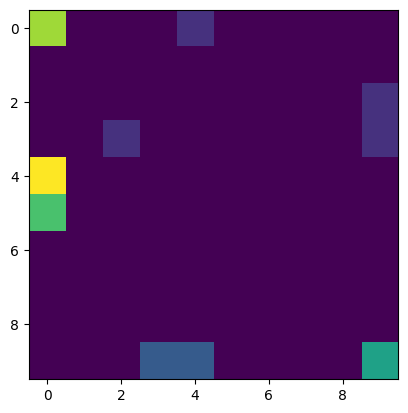

In [ ]:
# plt.close()
# plt.imshow(grid_color)
# plt.show()

In [ ]:
#Confusion_Matrix, input_vector_database[0].shape, np.sum(Confusion_Matrix)

## Initializing the weights in the SOM network randomly
- Train SOM with grid `20 x 20`,`40 x 40`, `80 x 80`

In [ ]:
def getAccuracy(confusion_matrix):
    return np.trace(confusion_matrix) / np.sum(confusion_matrix)

In [ ]:
learning_rates = [0.01, 0.1, 0.3, 0.5, 0.7, 0.9 , 1]

for lr in learning_rates:
    print(f"Learning Rate: {lr}")
    som_trained = SOM([28, 28], Xtr_flatten, ndim=20, eta0=lr)
    confusion_matrix, shape, sum_matrix = getConfusionMatrix(Xtr_flatten, som_trained, ndim=20)
    print(confusion_matrix)
    print(f"Accuracy: {np.trace(confusion_matrix) / sum_matrix}")
